In [5]:
!pip install opencv-python

# 1st variant - Simple CNN

In [99]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
from tempfile import TemporaryDirectory
from tqdm.autonotebook import tqdm
from sklearn.metrics import balanced_accuracy_score, f1_score

# Enables the inbuilt cudnn auto-tuner to find the best algorithm to use for your hardware.
# Effective when input sizes for the network do not vary.
cudnn.benchmark = True

plt.ion() # interactive mode

import warnings
# filter warnings
warnings.filterwarnings('ignore')
import torch.nn.functional as F

In [100]:

# У вашій архітектурі передбачено розмір виходу 8x8 після 3-х згорткових шарів. 
# Якщо вхідні зображення мають розмір 150x150, це може спричинити помилку в розмірностях. 
# Вам слід впевнитися, що розмір вхідних даних співпадає з передбаченим:
# data_transforms = {
#     'train': transforms.Compose([
#         transforms.Resize((64, 64)),  # Зміна розміру
#         # transforms.RandomHorizontalFlip(),
#         transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#     ]),
#     'test': transforms.Compose([
#         transforms.Resize((64, 64)),  # Зміна розміру
#         transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#     ]),
# }

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((128, 128)),  # Зміна розміру
        transforms.RandomHorizontalFlip(),
        # transforms.RandomRotation(20),
        # transforms.RandomCrop(64, 64),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize((128, 128)),  # Зміна розміру
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [101]:
train_dir = '/kaggle/input/intel-image-classification/seg_train/seg_train'
test_dir = '/kaggle/input/intel-image-classification/seg_test/seg_test'

# Create datasets using ImageFolder
train_dataset = datasets.ImageFolder(train_dir, data_transforms['train'])
test_dataset = datasets.ImageFolder(test_dir, data_transforms['test'])

# Print dataset classes for verification

print('train set size:', len(train_dataset))
print('test set size:', len(test_dataset))
print(f"Classes in train set: {train_dataset.classes}")
print(f"Classes in test set: {test_dataset.classes}")

# # Створимо клас DataLoader.
train_dataloader = DataLoader(train_dataset,
                              batch_size=128,
                              shuffle=True,
                              num_workers=0)

test_dataloader = DataLoader(test_dataset,
                             batch_size=128,
                             shuffle=False,
                             num_workers=0)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

train set size: 14034
test set size: 3000
Classes in train set: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Classes in test set: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [102]:
# Перевірка DataLoader
for train_batch, labels_batch in train_dataloader:
    print(f"Train batch shape: {train_batch.shape}")
    print(f"Labels batch shape: {labels_batch.shape}")
    break

Train batch shape: torch.Size([128, 3, 128, 128])
Labels batch shape: torch.Size([128])


In [103]:
dataset_sizes = {'train': len(train_dataset), 'test': len(test_dataset)}
class_names = train_dataset.classes

# Створимо функцію для відображення прикладів.
def imshow(inp, title=None):

    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406]) # Imagenet mean
    std = np.array([0.229, 0.224, 0.225]) # Imagenet std
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(200, 200))  # Збільшуємо розмір зображення
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Get a batch of training data  /  Візуалізуємо один батч даних.
inputs, classes = next(iter(train_dataloader))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [90]:
class BaselineModel(nn.Module):

    def __init__(self, ):
        super().__init__()
        self.num_channels = 32

        # each of the convolution layers below have the arguments (input_channels, output_channels, filter_size,
        # stride, padding). We also include batch normalisation layers that help stabilise training.

        self.conv1 = nn.Conv2d(3, self.num_channels, 3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(self.num_channels, self.num_channels*2, 3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(self.num_channels*2, self.num_channels*4, 3, stride=1, padding=1)

        # 2 fully connected layers to transform the output of the convolution layers to the final output
        self.fc1 = nn.Linear(8*8*self.num_channels*4, self.num_channels*4)
        self.fc2 = nn.Linear(self.num_channels*4, 6)

    def forward(self, s):
        #                                                  -> batch_size x 3 x 64 x 64
        # we apply the convolution layers, followed by batch normalisation, maxpool and relu x 3
        s = self.conv1(s)                                   # batch_size x num_channels x 64 x 64
        s = F.relu(F.max_pool2d(s, 2))                      # batch_size x num_channels x 32 x 32
        s = self.conv2(s)                                   # batch_size x num_channels*2 x 32 x 32
        s = F.relu(F.max_pool2d(s, 2))                      # batch_size x num_channels*2 x 16 x 16
        s = self.conv3(s)                                   # batch_size x num_channels*4 x 16 x 16
        s = F.relu(F.max_pool2d(s, 2))                      # batch_size x num_channels*4 x 8 x 8

        # flatten the output for each image
        s = s.view(-1, 8*8*self.num_channels*4)             # batch_size x 8*8*num_channels*4

        # apply 2 fully connected layers with dropout
        s = F.relu(self.fc1(s))                             # batch_size x self.num_channels*4
        s = self.fc2(s)                                     # batch_size x 6

        # apply log softmax on each image's output (this is recommended over applying softmax
        # since it is numerically more stable)
        return F.log_softmax(s, dim=1)

In [104]:
class Model128(nn.Module):
    def __init__(self):
        super().__init__()
        self.num_channels = 64  # Базова кількість фільтрів

        # Блоки згорток
        self.conv1 = nn.Conv2d(3, self.num_channels, 3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(self.num_channels)  # Batch Normalization

        self.conv2 = nn.Conv2d(self.num_channels, self.num_channels * 2, 3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(self.num_channels * 2)

        self.conv3 = nn.Conv2d(self.num_channels * 2, self.num_channels * 4, 3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(self.num_channels * 4)

        # Додатковий шар
        self.conv4 = nn.Conv2d(self.num_channels * 4, self.num_channels * 8, 3, stride=1, padding=1)
        self.bn4 = nn.BatchNorm2d(self.num_channels * 8)

        # Fully Connected шари
        self.fc1 = nn.Linear(8 * 8 * self.num_channels * 8, self.num_channels * 8)  # Підлаштовуємо розмірність
        self.fc2 = nn.Linear(self.num_channels * 8, self.num_channels * 4)
        self.fc3 = nn.Linear(self.num_channels * 4, 6)  # Кількість класів

    def forward(self, s):
        # Згорткові шари з BatchNorm та MaxPooling
        s = F.relu(self.bn1(F.max_pool2d(self.conv1(s), 2)))  # 64x64
        s = F.relu(self.bn2(F.max_pool2d(self.conv2(s), 2)))  # 32x32
        s = F.relu(self.bn3(F.max_pool2d(self.conv3(s), 2)))  # 16x16
        s = F.relu(self.bn4(F.max_pool2d(self.conv4(s), 2)))  # 8x8

        # Перетворюємо тензор у плоский вигляд
        s = s.view(-1, 8 * 8 * self.num_channels * 8)

        # Fully Connected шари з Dropout
        s = F.relu(self.fc1(s))
        s = F.dropout(s, p=0.5, training=self.training)  # Dropout для боротьби з перенавчанням
        s = F.relu(self.fc2(s))
        s = F.dropout(s, p=0.5, training=self.training)
        return F.log_softmax(self.fc3(s), dim=1)

In [105]:
cuda = torch.cuda.is_available()

# Set the random seed for reproducible experiments
torch.manual_seed(42)
if cuda:
    torch.cuda.manual_seed(42)

# Specify a computing device
device = 'cuda' if cuda else None
cuda

True

In [106]:
# Define the model and optimizer
#model = BaselineModel().to(device)
model = Model128().to(device)
# optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
optimizer = torch.optim.SGD(model.parameters(), lr=1e-4, momentum=0.9)

In [107]:
model

Model128(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=32768, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=6, bias=True)
)

In [41]:
# from collections import Counter
# class_counts = Counter(image_datasets['train'].targets)
# class_counts

In [108]:
# os.environ['WANDB_CONSOLE'] = 'off'

# Define loss function
criterion = nn.CrossEntropyLoss().to(device)

# Train the model

train_losses = []
train_accs = []
train_f1 = []

test_losses = []
test_accs = []
test_f1 = []

num_epochs = 200

for epoch in tqdm(range(num_epochs), disable=True):
# for epoch in range(num_epochs):    

    # Train step
    model.train()

    train_epoch_loss = []
    train_epoch_acc = []
    train_epoch_f1 = []

    for i, (train_batch, labels_batch) in tqdm(enumerate(train_dataloader)):
        if cuda:
            train_batch, labels_batch = train_batch.cuda(non_blocking=True), labels_batch.cuda(non_blocking=True)
        
        
        # print(f'Input shape to model: {train_batch.shape}')  # Перевірка форми перед передачею в модель
        # compute model output and loss
        output_batch = model(train_batch)
        # print(f'Output shape from model: {output_batch.shape}')
        loss = criterion(output_batch, labels_batch)

        # clear previous gradients, compute gradients of all variables wrt loss
        optimizer.zero_grad()
        loss.backward()

        # performs updates using calculated gradients
        optimizer.step()

        batch_loss = loss.cpu().detach().numpy()
        batch_acc = balanced_accuracy_score(np.argmax(output_batch.cpu().detach().numpy(), axis=1),
                                            labels_batch.cpu().detach().numpy())
        # Calculate F1 score for the batch
        batch_f1 = f1_score(labels_batch.cpu().detach().numpy(), 
                             np.argmax(output_batch.cpu().detach().numpy(), axis=1), 
                             average='weighted')


        train_epoch_loss.append(batch_loss)
        train_epoch_acc.append(batch_acc)
        train_epoch_f1.append(batch_f1)

        if i >=4:
              break


    print(f'Train epoch [{epoch+1}/{num_epochs}], Loss: {np.mean(train_epoch_loss):.4f}, Acc: {np.mean(train_epoch_acc)}, F1: {np.mean(train_epoch_f1):.4f}')
    train_accs.append(np.mean(train_epoch_acc))
    train_losses.append(np.mean(train_epoch_loss))
    train_f1.append(np.mean(train_epoch_f1))

    # Eval step

    model.eval()

    test_epoch_loss = []
    test_epoch_acc = []
    test_epoch_f1 = []

    with torch.no_grad():

        for i, (test_batch, labels_batch) in enumerate(test_dataloader):
            if cuda:
                test_batch, labels_batch = test_batch.cuda(non_blocking=True), labels_batch.cuda(non_blocking=True)

            # compute model output and loss
            output_batch = model(test_batch)

            loss = criterion(output_batch, labels_batch)

            batch_loss = loss.cpu().detach().numpy()
            batch_acc = balanced_accuracy_score(np.argmax(output_batch.cpu().detach().numpy(), axis=1),
                                                labels_batch.cpu().detach().numpy())
            # Calculate F1 score for the batch
            batch_f1 = f1_score(labels_batch.cpu().detach().numpy(), 
                                 np.argmax(output_batch.cpu().detach().numpy(), axis=1), 
                                 average='weighted')

            test_epoch_loss.append(batch_loss)
            test_epoch_acc.append(batch_acc)
            test_epoch_f1.append(batch_f1)

    print(f'Test epoch [{epoch+1}/{num_epochs}], Loss: {np.mean(test_epoch_loss):.4f}, Acc: {np.mean(test_epoch_acc)}, F1: {np.mean(test_epoch_f1):.4f}')
    test_accs.append(np.mean(test_epoch_acc))
    test_losses.append(np.mean(test_epoch_loss))
    test_f1.append(np.mean(test_epoch_f1))

0it [00:00, ?it/s]

Train epoch [1/200], Loss: 1.7967, Acc: 0.19478505288514356, F1: 0.0932
Test epoch [1/200], Loss: 1.7920, Acc: 0.18001302083333334, F1: 0.1706


0it [00:00, ?it/s]

Train epoch [2/200], Loss: 1.7910, Acc: 0.20978480009307293, F1: 0.1151
Test epoch [2/200], Loss: 1.7917, Acc: 0.18001302083333334, F1: 0.1706


0it [00:00, ?it/s]

Train epoch [3/200], Loss: 1.8001, Acc: 0.22478923984258511, F1: 0.1239
Test epoch [3/200], Loss: 1.7910, Acc: 0.18001302083333334, F1: 0.1706


0it [00:00, ?it/s]

Train epoch [4/200], Loss: 1.7834, Acc: 0.22819955558504795, F1: 0.1337
Test epoch [4/200], Loss: 1.7896, Acc: 0.18001302083333334, F1: 0.1706


0it [00:00, ?it/s]

Train epoch [5/200], Loss: 1.7768, Acc: 0.22932140988049404, F1: 0.1689
Test epoch [5/200], Loss: 1.7856, Acc: 0.2772352430555555, F1: 0.1753


0it [00:00, ?it/s]

Train epoch [6/200], Loss: 1.7710, Acc: 0.2402200793940009, F1: 0.1879
Test epoch [6/200], Loss: 1.7783, Acc: 0.25730397482365985, F1: 0.2233


0it [00:00, ?it/s]

Train epoch [7/200], Loss: 1.7738, Acc: 0.22207146292107494, F1: 0.1818
Test epoch [7/200], Loss: 1.7678, Acc: 0.22132395420675344, F1: 0.3324


0it [00:00, ?it/s]

Train epoch [8/200], Loss: 1.7586, Acc: 0.23618474620799867, F1: 0.1847
Test epoch [8/200], Loss: 1.7557, Acc: 0.20733559960178752, F1: 0.3999


0it [00:00, ?it/s]

Train epoch [9/200], Loss: 1.7517, Acc: 0.2768368588667999, F1: 0.1928
Test epoch [9/200], Loss: 1.7445, Acc: 0.19799833245674914, F1: 0.4239


0it [00:00, ?it/s]

Train epoch [10/200], Loss: 1.7434, Acc: 0.3143967738094598, F1: 0.2198
Test epoch [10/200], Loss: 1.7341, Acc: 0.20316575117103972, F1: 0.4395


0it [00:00, ?it/s]

Train epoch [11/200], Loss: 1.7481, Acc: 0.2424882467168933, F1: 0.2003
Test epoch [11/200], Loss: 1.7247, Acc: 0.19815931932723863, F1: 0.4440


0it [00:00, ?it/s]

Train epoch [12/200], Loss: 1.7311, Acc: 0.30912908485712876, F1: 0.2556
Test epoch [12/200], Loss: 1.7147, Acc: 0.1982446118007919, F1: 0.4480


0it [00:00, ?it/s]

Train epoch [13/200], Loss: 1.7165, Acc: 0.37021369447259544, F1: 0.2581
Test epoch [13/200], Loss: 1.7064, Acc: 0.19895471140268586, F1: 0.4537


0it [00:00, ?it/s]

Train epoch [14/200], Loss: 1.7290, Acc: 0.2548977798008384, F1: 0.2231
Test epoch [14/200], Loss: 1.6974, Acc: 0.19258686495831792, F1: 0.4595


0it [00:00, ?it/s]

Train epoch [15/200], Loss: 1.7188, Acc: 0.33680440630610237, F1: 0.2498
Test epoch [15/200], Loss: 1.6902, Acc: 0.19466100726371302, F1: 0.4656


0it [00:00, ?it/s]

Train epoch [16/200], Loss: 1.6933, Acc: 0.4173721692747569, F1: 0.2975
Test epoch [16/200], Loss: 1.6824, Acc: 0.19404842173552317, F1: 0.4723


0it [00:00, ?it/s]

Train epoch [17/200], Loss: 1.6944, Acc: 0.36445807942362785, F1: 0.2726
Test epoch [17/200], Loss: 1.6745, Acc: 0.19353366750446946, F1: 0.4765


0it [00:00, ?it/s]

Train epoch [18/200], Loss: 1.6868, Acc: 0.3663107299835745, F1: 0.2684
Test epoch [18/200], Loss: 1.6671, Acc: 0.19323873804572334, F1: 0.4805


0it [00:00, ?it/s]

Train epoch [19/200], Loss: 1.6921, Acc: 0.3434037082294, F1: 0.2780
Test epoch [19/200], Loss: 1.6584, Acc: 0.18923503191230828, F1: 0.4816


0it [00:00, ?it/s]

Train epoch [20/200], Loss: 1.6767, Acc: 0.3751565483672518, F1: 0.3054
Test epoch [20/200], Loss: 1.6500, Acc: 0.1937210648148148, F1: 0.4866


0it [00:00, ?it/s]

Train epoch [21/200], Loss: 1.6619, Acc: 0.39953575946543335, F1: 0.3263
Test epoch [21/200], Loss: 1.6405, Acc: 0.19811417240891127, F1: 0.4871


0it [00:00, ?it/s]

Train epoch [22/200], Loss: 1.6489, Acc: 0.3776444080037568, F1: 0.3124
Test epoch [22/200], Loss: 1.6341, Acc: 0.20063744983803122, F1: 0.4888


0it [00:00, ?it/s]

Train epoch [23/200], Loss: 1.6533, Acc: 0.4081947916674585, F1: 0.3195
Test epoch [23/200], Loss: 1.6257, Acc: 0.20577141624676834, F1: 0.4921


0it [00:00, ?it/s]

Train epoch [24/200], Loss: 1.6342, Acc: 0.44040575631368695, F1: 0.3547
Test epoch [24/200], Loss: 1.6172, Acc: 0.1965655204569945, F1: 0.4983


0it [00:00, ?it/s]

Train epoch [25/200], Loss: 1.6465, Acc: 0.35799266844732064, F1: 0.3062
Test epoch [25/200], Loss: 1.6092, Acc: 0.21742751502854288, F1: 0.5026


0it [00:00, ?it/s]

Train epoch [26/200], Loss: 1.6293, Acc: 0.4479459923115531, F1: 0.3455
Test epoch [26/200], Loss: 1.6004, Acc: 0.22569719247057315, F1: 0.5056


0it [00:00, ?it/s]

Train epoch [27/200], Loss: 1.6541, Acc: 0.36637183918971583, F1: 0.2947
Test epoch [27/200], Loss: 1.5925, Acc: 0.22376505439005437, F1: 0.5137


0it [00:00, ?it/s]

Train epoch [28/200], Loss: 1.6110, Acc: 0.43464424181741856, F1: 0.3364
Test epoch [28/200], Loss: 1.5857, Acc: 0.2289124344223028, F1: 0.5229


0it [00:00, ?it/s]

Train epoch [29/200], Loss: 1.6273, Acc: 0.336664534795107, F1: 0.3010
Test epoch [29/200], Loss: 1.5768, Acc: 0.23717140753157703, F1: 0.5349


0it [00:00, ?it/s]

Train epoch [30/200], Loss: 1.6056, Acc: 0.3922734411014639, F1: 0.3195
Test epoch [30/200], Loss: 1.5659, Acc: 0.24184999397245854, F1: 0.5397


0it [00:00, ?it/s]

Train epoch [31/200], Loss: 1.5756, Acc: 0.47831303566833194, F1: 0.4092
Test epoch [31/200], Loss: 1.5583, Acc: 0.24111559139784947, F1: 0.5406


0it [00:00, ?it/s]

Train epoch [32/200], Loss: 1.5824, Acc: 0.42098741621727853, F1: 0.3405
Test epoch [32/200], Loss: 1.5493, Acc: 0.23659599757484515, F1: 0.5365


0it [00:00, ?it/s]

Train epoch [33/200], Loss: 1.5734, Acc: 0.43868179787146155, F1: 0.3605
Test epoch [33/200], Loss: 1.5429, Acc: 0.24136924717270136, F1: 0.5376


0it [00:00, ?it/s]

Train epoch [34/200], Loss: 1.5784, Acc: 0.4700369379209546, F1: 0.3641
Test epoch [34/200], Loss: 1.5305, Acc: 0.2376190899820636, F1: 0.5425


0it [00:00, ?it/s]

Train epoch [35/200], Loss: 1.5697, Acc: 0.41428863961684315, F1: 0.3736
Test epoch [35/200], Loss: 1.5213, Acc: 0.22808334605209604, F1: 0.5437


0it [00:00, ?it/s]

Train epoch [36/200], Loss: 1.5580, Acc: 0.4098509116347991, F1: 0.3618
Test epoch [36/200], Loss: 1.5149, Acc: 0.22803654435233386, F1: 0.5497


0it [00:00, ?it/s]

Train epoch [37/200], Loss: 1.5443, Acc: 0.4129235678390556, F1: 0.3724
Test epoch [37/200], Loss: 1.5072, Acc: 0.23530475652645996, F1: 0.5513


0it [00:00, ?it/s]

Train epoch [38/200], Loss: 1.5248, Acc: 0.43922625808972404, F1: 0.4080
Test epoch [38/200], Loss: 1.4984, Acc: 0.2187387896379125, F1: 0.5524


0it [00:00, ?it/s]

Train epoch [39/200], Loss: 1.5235, Acc: 0.45268024216425334, F1: 0.3871
Test epoch [39/200], Loss: 1.4908, Acc: 0.22012949197619544, F1: 0.5547


0it [00:00, ?it/s]

Train epoch [40/200], Loss: 1.4829, Acc: 0.508016447931055, F1: 0.4204
Test epoch [40/200], Loss: 1.4805, Acc: 0.22797037141700072, F1: 0.5578


0it [00:00, ?it/s]

Train epoch [41/200], Loss: 1.5462, Acc: 0.4220073718976498, F1: 0.3433
Test epoch [41/200], Loss: 1.4699, Acc: 0.22374308463660542, F1: 0.5602


0it [00:00, ?it/s]

Train epoch [42/200], Loss: 1.4837, Acc: 0.501975849029233, F1: 0.4365
Test epoch [42/200], Loss: 1.4630, Acc: 0.22106564153439154, F1: 0.5648


0it [00:00, ?it/s]

Train epoch [43/200], Loss: 1.4910, Acc: 0.37761140302263496, F1: 0.3485
Test epoch [43/200], Loss: 1.4553, Acc: 0.21913391919970868, F1: 0.5702


0it [00:00, ?it/s]

Train epoch [44/200], Loss: 1.4760, Acc: 0.4463422796009418, F1: 0.3982
Test epoch [44/200], Loss: 1.4461, Acc: 0.21859143049932525, F1: 0.5747


0it [00:00, ?it/s]

Train epoch [45/200], Loss: 1.4823, Acc: 0.49927787310359273, F1: 0.4097
Test epoch [45/200], Loss: 1.4411, Acc: 0.2245616342930874, F1: 0.5768


0it [00:00, ?it/s]

Train epoch [46/200], Loss: 1.4515, Acc: 0.5009010058368464, F1: 0.4176
Test epoch [46/200], Loss: 1.4297, Acc: 0.2295726539509837, F1: 0.5857


0it [00:00, ?it/s]

Train epoch [47/200], Loss: 1.4409, Acc: 0.4841978332653597, F1: 0.4282
Test epoch [47/200], Loss: 1.4240, Acc: 0.22257158149821196, F1: 0.5847


0it [00:00, ?it/s]

Train epoch [48/200], Loss: 1.4623, Acc: 0.5021867447698662, F1: 0.4210
Test epoch [48/200], Loss: 1.4135, Acc: 0.22018308080808083, F1: 0.5914


0it [00:00, ?it/s]

Train epoch [49/200], Loss: 1.4511, Acc: 0.4832475763790744, F1: 0.4115
Test epoch [49/200], Loss: 1.4070, Acc: 0.22024234430000686, F1: 0.5984


0it [00:00, ?it/s]

Train epoch [50/200], Loss: 1.4500, Acc: 0.45664317524335213, F1: 0.4090
Test epoch [50/200], Loss: 1.3985, Acc: 0.21803217670190192, F1: 0.6072


0it [00:00, ?it/s]

Train epoch [51/200], Loss: 1.4648, Acc: 0.42250385711381977, F1: 0.4015
Test epoch [51/200], Loss: 1.3917, Acc: 0.2230612385526601, F1: 0.6141


0it [00:00, ?it/s]

Train epoch [52/200], Loss: 1.4523, Acc: 0.479561056244597, F1: 0.4266
Test epoch [52/200], Loss: 1.3847, Acc: 0.22342112433172331, F1: 0.6204


0it [00:00, ?it/s]

Train epoch [53/200], Loss: 1.4210, Acc: 0.4869654961760063, F1: 0.4353
Test epoch [53/200], Loss: 1.3797, Acc: 0.22321398386416616, F1: 0.6232


0it [00:00, ?it/s]

Train epoch [54/200], Loss: 1.4393, Acc: 0.48201686275295097, F1: 0.4322
Test epoch [54/200], Loss: 1.3691, Acc: 0.22345160583021895, F1: 0.6263


0it [00:00, ?it/s]

Train epoch [55/200], Loss: 1.4252, Acc: 0.47382209572905865, F1: 0.4254
Test epoch [55/200], Loss: 1.3605, Acc: 0.22632402719528297, F1: 0.6319


0it [00:00, ?it/s]

Train epoch [56/200], Loss: 1.3965, Acc: 0.5319543875649405, F1: 0.4778
Test epoch [56/200], Loss: 1.3560, Acc: 0.21897683976973467, F1: 0.6283


0it [00:00, ?it/s]

Train epoch [57/200], Loss: 1.3840, Acc: 0.4816424188722331, F1: 0.4555
Test epoch [57/200], Loss: 1.3516, Acc: 0.21929898576434123, F1: 0.6270


0it [00:00, ?it/s]

Train epoch [58/200], Loss: 1.3937, Acc: 0.498567358950856, F1: 0.4481
Test epoch [58/200], Loss: 1.3465, Acc: 0.2125177090496774, F1: 0.6275


0it [00:00, ?it/s]

Train epoch [59/200], Loss: 1.3646, Acc: 0.5042391286784096, F1: 0.4536
Test epoch [59/200], Loss: 1.3419, Acc: 0.21596074518021355, F1: 0.6295


0it [00:00, ?it/s]

Train epoch [60/200], Loss: 1.3704, Acc: 0.4709494028279194, F1: 0.4566
Test epoch [60/200], Loss: 1.3356, Acc: 0.2161335308765817, F1: 0.6353


0it [00:00, ?it/s]

Train epoch [61/200], Loss: 1.3587, Acc: 0.5035524824885496, F1: 0.4751
Test epoch [61/200], Loss: 1.3243, Acc: 0.22521363468320732, F1: 0.6454


0it [00:00, ?it/s]

Train epoch [62/200], Loss: 1.3709, Acc: 0.48311147758482526, F1: 0.4639
Test epoch [62/200], Loss: 1.3198, Acc: 0.21778292042085315, F1: 0.6469


0it [00:00, ?it/s]

Train epoch [63/200], Loss: 1.3579, Acc: 0.47814741298761954, F1: 0.4633
Test epoch [63/200], Loss: 1.3104, Acc: 0.2221567461401663, F1: 0.6462


0it [00:00, ?it/s]

Train epoch [64/200], Loss: 1.3774, Acc: 0.5014159285605205, F1: 0.4546
Test epoch [64/200], Loss: 1.3041, Acc: 0.21673197785581547, F1: 0.6456


0it [00:00, ?it/s]

Train epoch [65/200], Loss: 1.3559, Acc: 0.4725196095578532, F1: 0.4358
Test epoch [65/200], Loss: 1.2970, Acc: 0.22076906091950357, F1: 0.6497


0it [00:00, ?it/s]

Train epoch [66/200], Loss: 1.4152, Acc: 0.4524586409375412, F1: 0.4184
Test epoch [66/200], Loss: 1.2891, Acc: 0.2179562975644699, F1: 0.6553


0it [00:00, ?it/s]

Train epoch [67/200], Loss: 1.3272, Acc: 0.4978216103650409, F1: 0.4806
Test epoch [67/200], Loss: 1.2858, Acc: 0.21298185802506078, F1: 0.6577


0it [00:00, ?it/s]

Train epoch [68/200], Loss: 1.3439, Acc: 0.4702376891179286, F1: 0.4413
Test epoch [68/200], Loss: 1.2756, Acc: 0.20981581092521262, F1: 0.6609


0it [00:00, ?it/s]

Train epoch [69/200], Loss: 1.3424, Acc: 0.5204085002139268, F1: 0.4727
Test epoch [69/200], Loss: 1.2731, Acc: 0.21347519841099952, F1: 0.6643


0it [00:00, ?it/s]

Train epoch [70/200], Loss: 1.3142, Acc: 0.49471454422834615, F1: 0.4727
Test epoch [70/200], Loss: 1.2669, Acc: 0.21408601061166413, F1: 0.6675


0it [00:00, ?it/s]

Train epoch [71/200], Loss: 1.3413, Acc: 0.5167815511574773, F1: 0.4781
Test epoch [71/200], Loss: 1.2605, Acc: 0.21235202251553398, F1: 0.6694


0it [00:00, ?it/s]

Train epoch [72/200], Loss: 1.3151, Acc: 0.47396760740618865, F1: 0.4798
Test epoch [72/200], Loss: 1.2557, Acc: 0.21205991000895666, F1: 0.6665


0it [00:00, ?it/s]

Train epoch [73/200], Loss: 1.3036, Acc: 0.4775187264626869, F1: 0.4680
Test epoch [73/200], Loss: 1.2501, Acc: 0.21379847656866127, F1: 0.6687


0it [00:00, ?it/s]

Train epoch [74/200], Loss: 1.3086, Acc: 0.5168317490025464, F1: 0.5126
Test epoch [74/200], Loss: 1.2463, Acc: 0.2140177686734005, F1: 0.6690


0it [00:00, ?it/s]

Train epoch [75/200], Loss: 1.2980, Acc: 0.5293926579213167, F1: 0.5039
Test epoch [75/200], Loss: 1.2452, Acc: 0.21514458680762863, F1: 0.6679


0it [00:00, ?it/s]

Train epoch [76/200], Loss: 1.3020, Acc: 0.5341772141427481, F1: 0.4968
Test epoch [76/200], Loss: 1.2388, Acc: 0.21375993000701254, F1: 0.6687


0it [00:00, ?it/s]

Train epoch [77/200], Loss: 1.2813, Acc: 0.4696505617876487, F1: 0.4626
Test epoch [77/200], Loss: 1.2339, Acc: 0.21560044594990832, F1: 0.6706


0it [00:00, ?it/s]

Train epoch [78/200], Loss: 1.2829, Acc: 0.4865403618501628, F1: 0.4797
Test epoch [78/200], Loss: 1.2290, Acc: 0.21416274399137303, F1: 0.6730


0it [00:00, ?it/s]

Train epoch [79/200], Loss: 1.2722, Acc: 0.5250314178761817, F1: 0.5094
Test epoch [79/200], Loss: 1.2226, Acc: 0.21852475468427812, F1: 0.6757


0it [00:00, ?it/s]

Train epoch [80/200], Loss: 1.2576, Acc: 0.498657721777637, F1: 0.4935
Test epoch [80/200], Loss: 1.2187, Acc: 0.21255345440550244, F1: 0.6796


0it [00:00, ?it/s]

Train epoch [81/200], Loss: 1.2722, Acc: 0.49625297256702233, F1: 0.4875
Test epoch [81/200], Loss: 1.2095, Acc: 0.21243496886420676, F1: 0.6852


0it [00:00, ?it/s]

Train epoch [82/200], Loss: 1.2817, Acc: 0.5081160126371984, F1: 0.4925
Test epoch [82/200], Loss: 1.2054, Acc: 0.21516664016727785, F1: 0.6843


0it [00:00, ?it/s]

Train epoch [83/200], Loss: 1.2468, Acc: 0.5358683422188426, F1: 0.4947
Test epoch [83/200], Loss: 1.1983, Acc: 0.2125343214783857, F1: 0.6902


0it [00:00, ?it/s]

Train epoch [84/200], Loss: 1.2397, Acc: 0.5486924436058874, F1: 0.5414
Test epoch [84/200], Loss: 1.1956, Acc: 0.2181321814052027, F1: 0.6890


0it [00:00, ?it/s]

Train epoch [85/200], Loss: 1.2613, Acc: 0.528092610110412, F1: 0.5135
Test epoch [85/200], Loss: 1.1886, Acc: 0.22060101583926062, F1: 0.6903


0it [00:00, ?it/s]

Train epoch [86/200], Loss: 1.2054, Acc: 0.5547943175341199, F1: 0.5302
Test epoch [86/200], Loss: 1.1849, Acc: 0.2193060813072484, F1: 0.6913


0it [00:00, ?it/s]

Train epoch [87/200], Loss: 1.2176, Acc: 0.5189075992475828, F1: 0.4987
Test epoch [87/200], Loss: 1.1743, Acc: 0.21357670185372282, F1: 0.6928


0it [00:00, ?it/s]

Train epoch [88/200], Loss: 1.2674, Acc: 0.5290943574619361, F1: 0.5130
Test epoch [88/200], Loss: 1.1734, Acc: 0.21306370952003226, F1: 0.6975


0it [00:00, ?it/s]

Train epoch [89/200], Loss: 1.2417, Acc: 0.5334004949229595, F1: 0.5212
Test epoch [89/200], Loss: 1.1687, Acc: 0.21542620767643597, F1: 0.6993


0it [00:00, ?it/s]

Train epoch [90/200], Loss: 1.2219, Acc: 0.5395661327600714, F1: 0.5247
Test epoch [90/200], Loss: 1.1652, Acc: 0.21207671088389865, F1: 0.7016


0it [00:00, ?it/s]

Train epoch [91/200], Loss: 1.1803, Acc: 0.5355950840163032, F1: 0.5250
Test epoch [91/200], Loss: 1.1587, Acc: 0.21239480796192275, F1: 0.7072


0it [00:00, ?it/s]

Train epoch [92/200], Loss: 1.2028, Acc: 0.5452101628435496, F1: 0.5328
Test epoch [92/200], Loss: 1.1521, Acc: 0.2070906400893818, F1: 0.7077


0it [00:00, ?it/s]

Train epoch [93/200], Loss: 1.2020, Acc: 0.5595071282587261, F1: 0.5400
Test epoch [93/200], Loss: 1.1473, Acc: 0.20845364906108643, F1: 0.7092


0it [00:00, ?it/s]

Train epoch [94/200], Loss: 1.1987, Acc: 0.5429411497423235, F1: 0.5364
Test epoch [94/200], Loss: 1.1445, Acc: 0.21104240929494608, F1: 0.7097


0it [00:00, ?it/s]

Train epoch [95/200], Loss: 1.1974, Acc: 0.5477291385115783, F1: 0.5447
Test epoch [95/200], Loss: 1.1378, Acc: 0.20851678037421775, F1: 0.7107


0it [00:00, ?it/s]

Train epoch [96/200], Loss: 1.2451, Acc: 0.5130153395766088, F1: 0.5087
Test epoch [96/200], Loss: 1.1338, Acc: 0.2084700021201523, F1: 0.7129


0it [00:00, ?it/s]

Train epoch [97/200], Loss: 1.2147, Acc: 0.5527917272377629, F1: 0.5574
Test epoch [97/200], Loss: 1.1277, Acc: 0.20823325969590986, F1: 0.7088


0it [00:00, ?it/s]

Train epoch [98/200], Loss: 1.2211, Acc: 0.5241725288919644, F1: 0.5163
Test epoch [98/200], Loss: 1.1233, Acc: 0.20823325969590986, F1: 0.7065


0it [00:00, ?it/s]

Train epoch [99/200], Loss: 1.2327, Acc: 0.5285783080484342, F1: 0.5087
Test epoch [99/200], Loss: 1.1225, Acc: 0.2082472849434075, F1: 0.7057


0it [00:00, ?it/s]

Train epoch [100/200], Loss: 1.1577, Acc: 0.5834507262742339, F1: 0.5805
Test epoch [100/200], Loss: 1.1180, Acc: 0.20826613059397356, F1: 0.7064


0it [00:00, ?it/s]

Train epoch [101/200], Loss: 1.2089, Acc: 0.5633182919242398, F1: 0.5411
Test epoch [101/200], Loss: 1.1170, Acc: 0.2110767155575027, F1: 0.7068


0it [00:00, ?it/s]

Train epoch [102/200], Loss: 1.1758, Acc: 0.5513760001924302, F1: 0.5354
Test epoch [102/200], Loss: 1.1135, Acc: 0.21106308202158922, F1: 0.7075


0it [00:00, ?it/s]

Train epoch [103/200], Loss: 1.1728, Acc: 0.5268286435806611, F1: 0.5370
Test epoch [103/200], Loss: 1.1116, Acc: 0.21067526320144866, F1: 0.7093


0it [00:00, ?it/s]

Train epoch [104/200], Loss: 1.1673, Acc: 0.5362084462843042, F1: 0.5201
Test epoch [104/200], Loss: 1.1094, Acc: 0.20945712737249597, F1: 0.7109


0it [00:00, ?it/s]

Train epoch [105/200], Loss: 1.2002, Acc: 0.5196266722149149, F1: 0.5031
Test epoch [105/200], Loss: 1.1044, Acc: 0.206623836232203, F1: 0.7135


0it [00:00, ?it/s]

Train epoch [106/200], Loss: 1.1819, Acc: 0.5576319017158406, F1: 0.5473
Test epoch [106/200], Loss: 1.1011, Acc: 0.20541625817972228, F1: 0.7190


0it [00:00, ?it/s]

Train epoch [107/200], Loss: 1.1546, Acc: 0.5448950488655312, F1: 0.5531
Test epoch [107/200], Loss: 1.0979, Acc: 0.20421642705100584, F1: 0.7217


0it [00:00, ?it/s]

Train epoch [108/200], Loss: 1.1761, Acc: 0.5539190260842963, F1: 0.5438
Test epoch [108/200], Loss: 1.0933, Acc: 0.20433812024591855, F1: 0.7235


0it [00:00, ?it/s]

Train epoch [109/200], Loss: 1.1417, Acc: 0.5585455503762686, F1: 0.5511
Test epoch [109/200], Loss: 1.0854, Acc: 0.20429176647433342, F1: 0.7261


0it [00:00, ?it/s]

Train epoch [110/200], Loss: 1.1364, Acc: 0.5085753156418241, F1: 0.5346
Test epoch [110/200], Loss: 1.0836, Acc: 0.2044667670799917, F1: 0.7276


0it [00:00, ?it/s]

Train epoch [111/200], Loss: 1.1484, Acc: 0.5706800869503, F1: 0.5603
Test epoch [111/200], Loss: 1.0778, Acc: 0.20441264392397632, F1: 0.7270


0it [00:00, ?it/s]

Train epoch [112/200], Loss: 1.1306, Acc: 0.576581658154258, F1: 0.5793
Test epoch [112/200], Loss: 1.0747, Acc: 0.20433135540854022, F1: 0.7285


0it [00:00, ?it/s]

Train epoch [113/200], Loss: 1.1793, Acc: 0.5273370717131374, F1: 0.5237
Test epoch [113/200], Loss: 1.0689, Acc: 0.20449824256858226, F1: 0.7283


0it [00:00, ?it/s]

Train epoch [114/200], Loss: 1.1536, Acc: 0.5535916041913362, F1: 0.5418
Test epoch [114/200], Loss: 1.0642, Acc: 0.20389333593389702, F1: 0.7278


0it [00:00, ?it/s]

Train epoch [115/200], Loss: 1.1370, Acc: 0.5611236935962237, F1: 0.5539
Test epoch [115/200], Loss: 1.0628, Acc: 0.20382968587293648, F1: 0.7285


0it [00:00, ?it/s]

Train epoch [116/200], Loss: 1.1742, Acc: 0.5667920965510815, F1: 0.5489
Test epoch [116/200], Loss: 1.0545, Acc: 0.20382662540146582, F1: 0.7320


0it [00:00, ?it/s]

Train epoch [117/200], Loss: 1.0959, Acc: 0.5945312286434672, F1: 0.5985
Test epoch [117/200], Loss: 1.0534, Acc: 0.20384532436162872, F1: 0.7368


0it [00:00, ?it/s]

Train epoch [118/200], Loss: 1.1007, Acc: 0.5484427409667437, F1: 0.5512
Test epoch [118/200], Loss: 1.0501, Acc: 0.20637966634208252, F1: 0.7385


0it [00:00, ?it/s]

Train epoch [119/200], Loss: 1.1522, Acc: 0.5442904027500358, F1: 0.5428
Test epoch [119/200], Loss: 1.0468, Acc: 0.20604170713627826, F1: 0.7376


0it [00:00, ?it/s]

Train epoch [120/200], Loss: 1.0914, Acc: 0.5821722809531382, F1: 0.5747
Test epoch [120/200], Loss: 1.0452, Acc: 0.20634522952978088, F1: 0.7388


0it [00:00, ?it/s]

Train epoch [121/200], Loss: 1.0959, Acc: 0.6133918973673884, F1: 0.6151
Test epoch [121/200], Loss: 1.0443, Acc: 0.2077648800773384, F1: 0.7384


0it [00:00, ?it/s]

Train epoch [122/200], Loss: 1.1673, Acc: 0.553175671568275, F1: 0.5486
Test epoch [122/200], Loss: 1.0374, Acc: 0.20634902430816582, F1: 0.7409


0it [00:00, ?it/s]

Train epoch [123/200], Loss: 1.0858, Acc: 0.5590876982860367, F1: 0.5634
Test epoch [123/200], Loss: 1.0361, Acc: 0.20824280583135094, F1: 0.7442


0it [00:00, ?it/s]

Train epoch [124/200], Loss: 1.1101, Acc: 0.572816800726469, F1: 0.5815
Test epoch [124/200], Loss: 1.0296, Acc: 0.2065605035783471, F1: 0.7474


0it [00:00, ?it/s]

Train epoch [125/200], Loss: 1.1273, Acc: 0.5235817993419587, F1: 0.5197
Test epoch [125/200], Loss: 1.0291, Acc: 0.20779997215334198, F1: 0.7431


0it [00:00, ?it/s]

Train epoch [126/200], Loss: 1.1203, Acc: 0.5466635510363581, F1: 0.5501
Test epoch [126/200], Loss: 1.0256, Acc: 0.2061909149723701, F1: 0.7436


0it [00:00, ?it/s]

Train epoch [127/200], Loss: 1.0649, Acc: 0.609410238368137, F1: 0.6024
Test epoch [127/200], Loss: 1.0227, Acc: 0.2075980787150602, F1: 0.7460


0it [00:00, ?it/s]

Train epoch [128/200], Loss: 1.0897, Acc: 0.5662802262611578, F1: 0.5639
Test epoch [128/200], Loss: 1.0196, Acc: 0.2075980787150602, F1: 0.7476


0it [00:00, ?it/s]

Train epoch [129/200], Loss: 1.0624, Acc: 0.5963253855520934, F1: 0.5928
Test epoch [129/200], Loss: 1.0168, Acc: 0.20763024245775022, F1: 0.7462


0it [00:00, ?it/s]

Train epoch [130/200], Loss: 1.1295, Acc: 0.5816259777527379, F1: 0.5652
Test epoch [130/200], Loss: 1.0134, Acc: 0.20763024245775022, F1: 0.7480


0it [00:00, ?it/s]

Train epoch [131/200], Loss: 1.0976, Acc: 0.5674847869056937, F1: 0.5679
Test epoch [131/200], Loss: 1.0104, Acc: 0.20625453315631628, F1: 0.7481


0it [00:00, ?it/s]

Train epoch [132/200], Loss: 1.1039, Acc: 0.6064298350361975, F1: 0.5980
Test epoch [132/200], Loss: 1.0091, Acc: 0.20779774303285947, F1: 0.7483


0it [00:00, ?it/s]

Train epoch [133/200], Loss: 1.0526, Acc: 0.5939780072595113, F1: 0.5842
Test epoch [133/200], Loss: 1.0068, Acc: 0.20762855795935073, F1: 0.7497


0it [00:00, ?it/s]

Train epoch [134/200], Loss: 1.0964, Acc: 0.577579010572919, F1: 0.5781
Test epoch [134/200], Loss: 1.0031, Acc: 0.2074851515174506, F1: 0.7485


0it [00:00, ?it/s]

Train epoch [135/200], Loss: 1.0967, Acc: 0.5706955681234168, F1: 0.5782
Test epoch [135/200], Loss: 1.0009, Acc: 0.20764283555295862, F1: 0.7501


0it [00:00, ?it/s]

Train epoch [136/200], Loss: 1.1234, Acc: 0.5638358728408005, F1: 0.5626
Test epoch [136/200], Loss: 0.9968, Acc: 0.20575288146637613, F1: 0.7520


0it [00:00, ?it/s]

Train epoch [137/200], Loss: 1.0324, Acc: 0.5878276664764303, F1: 0.5935
Test epoch [137/200], Loss: 0.9946, Acc: 0.20728308566027864, F1: 0.7511


0it [00:00, ?it/s]

Train epoch [138/200], Loss: 1.0921, Acc: 0.5561555024734849, F1: 0.5464
Test epoch [138/200], Loss: 0.9941, Acc: 0.20736294619472928, F1: 0.7514


0it [00:00, ?it/s]

Train epoch [139/200], Loss: 1.0376, Acc: 0.6234814509238448, F1: 0.6243
Test epoch [139/200], Loss: 0.9898, Acc: 0.2065142364539294, F1: 0.7548


0it [00:00, ?it/s]

Train epoch [140/200], Loss: 1.0948, Acc: 0.5661576091790218, F1: 0.5641
Test epoch [140/200], Loss: 0.9880, Acc: 0.20794835256993607, F1: 0.7560


0it [00:00, ?it/s]

Train epoch [141/200], Loss: 1.0143, Acc: 0.6083676559830689, F1: 0.6118
Test epoch [141/200], Loss: 0.9850, Acc: 0.2071965675321937, F1: 0.7573


0it [00:00, ?it/s]

Train epoch [142/200], Loss: 1.0801, Acc: 0.5973734089293048, F1: 0.5946
Test epoch [142/200], Loss: 0.9800, Acc: 0.20690127787587867, F1: 0.7555


0it [00:00, ?it/s]

Train epoch [143/200], Loss: 1.0732, Acc: 0.5985737816821407, F1: 0.5890
Test epoch [143/200], Loss: 0.9778, Acc: 0.20707916215728717, F1: 0.7562


0it [00:00, ?it/s]

Train epoch [144/200], Loss: 1.0602, Acc: 0.5973684408417339, F1: 0.5922
Test epoch [144/200], Loss: 0.9744, Acc: 0.20699341267962348, F1: 0.7560


0it [00:00, ?it/s]

Train epoch [145/200], Loss: 1.0467, Acc: 0.6062117288760409, F1: 0.6067
Test epoch [145/200], Loss: 0.9702, Acc: 0.20723072217637437, F1: 0.7575


0it [00:00, ?it/s]

Train epoch [146/200], Loss: 1.0577, Acc: 0.5777054219293417, F1: 0.5785
Test epoch [146/200], Loss: 0.9675, Acc: 0.2069602540832021, F1: 0.7561


0it [00:00, ?it/s]

Train epoch [147/200], Loss: 1.1035, Acc: 0.5776070014366488, F1: 0.5777
Test epoch [147/200], Loss: 0.9658, Acc: 0.20706543577873893, F1: 0.7578


0it [00:00, ?it/s]

Train epoch [148/200], Loss: 0.9862, Acc: 0.6493857044961595, F1: 0.6342
Test epoch [148/200], Loss: 0.9626, Acc: 0.20807264700026992, F1: 0.7583


0it [00:00, ?it/s]

Train epoch [149/200], Loss: 0.9897, Acc: 0.6346414675376424, F1: 0.6355
Test epoch [149/200], Loss: 0.9598, Acc: 0.20827117946051768, F1: 0.7595


0it [00:00, ?it/s]

Train epoch [150/200], Loss: 1.0298, Acc: 0.607560854800087, F1: 0.5999
Test epoch [150/200], Loss: 0.9555, Acc: 0.20734811675614673, F1: 0.7626


0it [00:00, ?it/s]

Train epoch [151/200], Loss: 1.0446, Acc: 0.5847897255210373, F1: 0.5987
Test epoch [151/200], Loss: 0.9531, Acc: 0.20755334315323562, F1: 0.7631


0it [00:00, ?it/s]

Train epoch [152/200], Loss: 1.0224, Acc: 0.6207770575842909, F1: 0.6207
Test epoch [152/200], Loss: 0.9491, Acc: 0.20737982843759015, F1: 0.7624


0it [00:00, ?it/s]

Train epoch [153/200], Loss: 1.0127, Acc: 0.6018595568556072, F1: 0.6015
Test epoch [153/200], Loss: 0.9485, Acc: 0.20737518499275276, F1: 0.7640


0it [00:00, ?it/s]

Train epoch [154/200], Loss: 1.0397, Acc: 0.5982468546096221, F1: 0.5874
Test epoch [154/200], Loss: 0.9452, Acc: 0.2071049131092657, F1: 0.7629


0it [00:00, ?it/s]

Train epoch [155/200], Loss: 0.9724, Acc: 0.6326827741638215, F1: 0.6422
Test epoch [155/200], Loss: 0.9439, Acc: 0.20738316711280383, F1: 0.7649


0it [00:00, ?it/s]

Train epoch [156/200], Loss: 1.0011, Acc: 0.6187779338899354, F1: 0.6211
Test epoch [156/200], Loss: 0.9418, Acc: 0.2073442097061283, F1: 0.7671


0it [00:00, ?it/s]

Train epoch [157/200], Loss: 1.0313, Acc: 0.6054131638494875, F1: 0.6021
Test epoch [157/200], Loss: 0.9402, Acc: 0.20738640461604133, F1: 0.7673


0it [00:00, ?it/s]

Train epoch [158/200], Loss: 1.0338, Acc: 0.5744471553535772, F1: 0.5683
Test epoch [158/200], Loss: 0.9382, Acc: 0.20737518499275276, F1: 0.7667


0it [00:00, ?it/s]

Train epoch [159/200], Loss: 1.0327, Acc: 0.5931154518795648, F1: 0.5954
Test epoch [159/200], Loss: 0.9367, Acc: 0.20861862044405147, F1: 0.7662


0it [00:00, ?it/s]

Train epoch [160/200], Loss: 1.0610, Acc: 0.6117222514520637, F1: 0.5997
Test epoch [160/200], Loss: 0.9339, Acc: 0.20872064973627472, F1: 0.7680


0it [00:00, ?it/s]

Train epoch [161/200], Loss: 0.9467, Acc: 0.6040223878955249, F1: 0.6102
Test epoch [161/200], Loss: 0.9329, Acc: 0.20866672277537068, F1: 0.7685


0it [00:00, ?it/s]

Train epoch [162/200], Loss: 0.9909, Acc: 0.6148316520483815, F1: 0.6101
Test epoch [162/200], Loss: 0.9298, Acc: 0.20914124176552132, F1: 0.7721


0it [00:00, ?it/s]

Train epoch [163/200], Loss: 1.0073, Acc: 0.6497906174775089, F1: 0.6345
Test epoch [163/200], Loss: 0.9273, Acc: 0.20826600781737073, F1: 0.7740


0it [00:00, ?it/s]

Train epoch [164/200], Loss: 1.0029, Acc: 0.6444101077991686, F1: 0.6348
Test epoch [164/200], Loss: 0.9245, Acc: 0.2085256400374608, F1: 0.7793


0it [00:00, ?it/s]

Train epoch [165/200], Loss: 0.9729, Acc: 0.6227950350768138, F1: 0.6298
Test epoch [165/200], Loss: 0.9236, Acc: 0.20869866820528063, F1: 0.7807


0it [00:00, ?it/s]

Train epoch [166/200], Loss: 0.9689, Acc: 0.6198528488042105, F1: 0.6209
Test epoch [166/200], Loss: 0.9208, Acc: 0.20923421093851355, F1: 0.7820


0it [00:00, ?it/s]

Train epoch [167/200], Loss: 0.9834, Acc: 0.6372470640033302, F1: 0.6386
Test epoch [167/200], Loss: 0.9172, Acc: 0.20925592115987657, F1: 0.7835


0it [00:00, ?it/s]

Train epoch [168/200], Loss: 1.0006, Acc: 0.6119131965074556, F1: 0.6124
Test epoch [168/200], Loss: 0.9152, Acc: 0.20784327799700017, F1: 0.7834


0it [00:00, ?it/s]

Train epoch [169/200], Loss: 1.0103, Acc: 0.6529060587988709, F1: 0.6415
Test epoch [169/200], Loss: 0.9140, Acc: 0.20900846100861062, F1: 0.7858


0it [00:00, ?it/s]

Train epoch [170/200], Loss: 0.9761, Acc: 0.635323971954257, F1: 0.6301
Test epoch [170/200], Loss: 0.9115, Acc: 0.209155409482939, F1: 0.7850


0it [00:00, ?it/s]

Train epoch [171/200], Loss: 0.9846, Acc: 0.5729284665857304, F1: 0.5850
Test epoch [171/200], Loss: 0.9107, Acc: 0.20897548379150435, F1: 0.7840


0it [00:00, ?it/s]

Train epoch [172/200], Loss: 0.9219, Acc: 0.6625152880234056, F1: 0.6594
Test epoch [172/200], Loss: 0.9104, Acc: 0.20918184537608, F1: 0.7872


0it [00:00, ?it/s]

Train epoch [173/200], Loss: 0.9788, Acc: 0.6474978826251202, F1: 0.6425
Test epoch [173/200], Loss: 0.9064, Acc: 0.20763944518646982, F1: 0.7837


0it [00:00, ?it/s]

Train epoch [174/200], Loss: 0.9798, Acc: 0.6171322203492021, F1: 0.6130
Test epoch [174/200], Loss: 0.9057, Acc: 0.20760573576727046, F1: 0.7843


0it [00:00, ?it/s]

Train epoch [175/200], Loss: 0.9650, Acc: 0.6348752574615764, F1: 0.6327
Test epoch [175/200], Loss: 0.9013, Acc: 0.21194969737102398, F1: 0.7857


0it [00:00, ?it/s]

Train epoch [176/200], Loss: 0.9642, Acc: 0.6556374836539627, F1: 0.6567
Test epoch [176/200], Loss: 0.8977, Acc: 0.2099868426227973, F1: 0.7884


0it [00:00, ?it/s]

Train epoch [177/200], Loss: 0.9959, Acc: 0.6296555308938032, F1: 0.6264
Test epoch [177/200], Loss: 0.8958, Acc: 0.20898924465100932, F1: 0.7907


0it [00:00, ?it/s]

Train epoch [178/200], Loss: 1.0134, Acc: 0.622723632445471, F1: 0.6251
Test epoch [178/200], Loss: 0.8910, Acc: 0.2077492569744309, F1: 0.7934


0it [00:00, ?it/s]

Train epoch [179/200], Loss: 0.9892, Acc: 0.6535647806207311, F1: 0.6382
Test epoch [179/200], Loss: 0.8887, Acc: 0.20770172235380557, F1: 0.7946


0it [00:00, ?it/s]

Train epoch [180/200], Loss: 0.9735, Acc: 0.6437710745097787, F1: 0.6339
Test epoch [180/200], Loss: 0.8887, Acc: 0.20769701106178087, F1: 0.7937


0it [00:00, ?it/s]

Train epoch [181/200], Loss: 0.9651, Acc: 0.6384780544121976, F1: 0.6379
Test epoch [181/200], Loss: 0.8869, Acc: 0.20654749205140158, F1: 0.7939


0it [00:00, ?it/s]

Train epoch [182/200], Loss: 0.9838, Acc: 0.6123628878151787, F1: 0.6073
Test epoch [182/200], Loss: 0.8868, Acc: 0.20995295154392077, F1: 0.7929


0it [00:00, ?it/s]

Train epoch [183/200], Loss: 0.9749, Acc: 0.6283376111410051, F1: 0.6254
Test epoch [183/200], Loss: 0.8866, Acc: 0.20992276774768592, F1: 0.7942


0it [00:00, ?it/s]

Train epoch [184/200], Loss: 0.9323, Acc: 0.6478333863796021, F1: 0.6501
Test epoch [184/200], Loss: 0.8858, Acc: 0.21046812151884617, F1: 0.7935


0it [00:00, ?it/s]

Train epoch [185/200], Loss: 0.9712, Acc: 0.645191325818373, F1: 0.6369
Test epoch [185/200], Loss: 0.8847, Acc: 0.2100378654167385, F1: 0.7945


0it [00:00, ?it/s]

Train epoch [186/200], Loss: 0.9797, Acc: 0.6259342937382153, F1: 0.6280
Test epoch [186/200], Loss: 0.8823, Acc: 0.2100378654167385, F1: 0.7937


0it [00:00, ?it/s]

Train epoch [187/200], Loss: 0.9641, Acc: 0.6489387646955512, F1: 0.6467
Test epoch [187/200], Loss: 0.8773, Acc: 0.20744405782318076, F1: 0.7925


0it [00:00, ?it/s]

Train epoch [188/200], Loss: 1.0079, Acc: 0.6520605423554703, F1: 0.6447
Test epoch [188/200], Loss: 0.8755, Acc: 0.20766348992642095, F1: 0.7935


0it [00:00, ?it/s]

Train epoch [189/200], Loss: 0.9608, Acc: 0.6536912462299493, F1: 0.6411
Test epoch [189/200], Loss: 0.8721, Acc: 0.20744544354486474, F1: 0.7937


0it [00:00, ?it/s]

Train epoch [190/200], Loss: 0.9518, Acc: 0.6129044182522837, F1: 0.6130
Test epoch [190/200], Loss: 0.8703, Acc: 0.207676354874914, F1: 0.7943


0it [00:00, ?it/s]

Train epoch [191/200], Loss: 0.9437, Acc: 0.668901318039268, F1: 0.6603
Test epoch [191/200], Loss: 0.8692, Acc: 0.20896653294479384, F1: 0.7955


0it [00:00, ?it/s]

Train epoch [192/200], Loss: 0.9352, Acc: 0.6591078416074153, F1: 0.6635
Test epoch [192/200], Loss: 0.8689, Acc: 0.2089813303633603, F1: 0.7959


0it [00:00, ?it/s]

Train epoch [193/200], Loss: 0.9872, Acc: 0.6105226575548988, F1: 0.6028
Test epoch [193/200], Loss: 0.8688, Acc: 0.20762892610718697, F1: 0.7956


0it [00:00, ?it/s]

Train epoch [194/200], Loss: 0.9354, Acc: 0.637842375281914, F1: 0.6326
Test epoch [194/200], Loss: 0.8662, Acc: 0.21481699873753848, F1: 0.7984


0it [00:00, ?it/s]

Train epoch [195/200], Loss: 0.9471, Acc: 0.6372631917261967, F1: 0.6423
Test epoch [195/200], Loss: 0.8649, Acc: 0.2127135365797285, F1: 0.7987


0it [00:00, ?it/s]

Train epoch [196/200], Loss: 0.9172, Acc: 0.6430349013459586, F1: 0.6393
Test epoch [196/200], Loss: 0.8634, Acc: 0.20896653294479384, F1: 0.7986


0it [00:00, ?it/s]

Train epoch [197/200], Loss: 0.9305, Acc: 0.6558708657346989, F1: 0.6524
Test epoch [197/200], Loss: 0.8609, Acc: 0.20986091630598955, F1: 0.7993


0it [00:00, ?it/s]

Train epoch [198/200], Loss: 0.9627, Acc: 0.6383550599648213, F1: 0.6340
Test epoch [198/200], Loss: 0.8589, Acc: 0.20988928526292658, F1: 0.8029


0it [00:00, ?it/s]

Train epoch [199/200], Loss: 0.9761, Acc: 0.6542882607048938, F1: 0.6531
Test epoch [199/200], Loss: 0.8585, Acc: 0.21339842147555113, F1: 0.8023


0it [00:00, ?it/s]

Train epoch [200/200], Loss: 0.9715, Acc: 0.6158762414635155, F1: 0.6119
Test epoch [200/200], Loss: 0.8571, Acc: 0.21223623347233053, F1: 0.7997


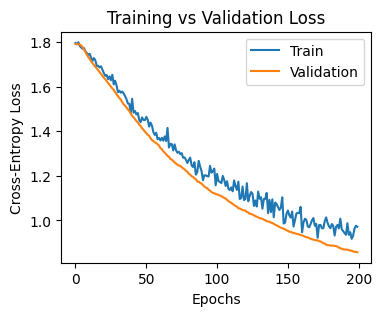

In [109]:
plt.figure(figsize=(4, 3))
plt.plot(train_losses, label='Train')
plt.plot(test_losses, label='Validation')
plt.legend(loc='best')
plt.xlabel('Epochs')
plt.ylabel('Cross-Entropy Loss')
plt.title('Training vs Validation Loss')
plt.show()

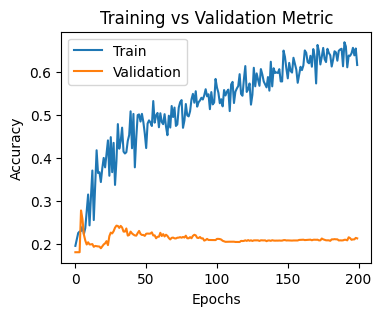

In [111]:
plt.figure(figsize=(4, 3))
plt.plot(train_accs, label='Train')
plt.plot(test_accs, label='Validation')
plt.legend(loc='best')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Metric')
plt.show()

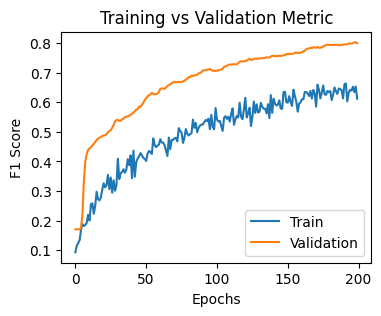

In [112]:
plt.figure(figsize=(4, 3))
plt.plot(train_f1, label='Train')
plt.plot(test_f1, label='Validation')
plt.legend(loc='best')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.title('Training vs Validation Metric')
plt.show()

# 2nd variant - Transfer Learning

In [113]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
from tempfile import TemporaryDirectory
from tqdm.autonotebook import tqdm
from sklearn.metrics import balanced_accuracy_score, f1_score

# Enables the inbuilt cudnn auto-tuner to find the best algorithm to use for your hardware.
# Effective when input sizes for the network do not vary.
cudnn.benchmark = True

plt.ion() # interactive mode

import warnings
# filter warnings
warnings.filterwarnings('ignore')
import torch.nn.functional as F


In [114]:
# Define transformations for train and test datasets
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),  # Resize images to 224x224
        transforms.RandomHorizontalFlip(),  # Random horizontal flip for augmentation
        transforms.ToTensor(),  # Convert to PyTorch tensor
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet stats
    ]),
    'test': transforms.Compose([
        transforms.Resize((224, 224)),  # Resize for test data
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [34]:
train_dir = '/kaggle/input/intel-image-classification/seg_train/seg_train'
test_dir = '/kaggle/input/intel-image-classification/seg_test/seg_test'

# Create datasets using ImageFolder
image_datasets = {
    'train': datasets.ImageFolder(train_dir, data_transforms['train']),
    'test': datasets.ImageFolder(test_dir, data_transforms['test']),
}

# Print dataset classes for verification


print('train set size:', len(image_datasets['train']))
print('test set size:', len(image_datasets['test']))
print(f"Classes in train set: {image_datasets['train'].classes}")
print(f"Classes in test set: {image_datasets['test'].classes}")

# Створимо клас DataLoader.
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=4)
              for x in ['train', 'test']}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
class_names = image_datasets['train'].classes

# print('dataset sizes:', dataset_sizes)
# print('class names:', class_names)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# print(dataloaders['train'])

train set size: 14034
test set size: 3000
Classes in train set: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Classes in test set: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


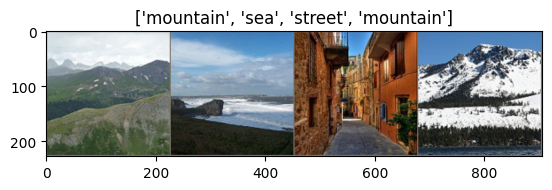

In [35]:
# Створимо функцію для відображення прикладів.
def imshow(inp, title=None):

    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406]) # Imagenet mean
    std = np.array([0.229, 0.224, 0.225]) # Imagenet std
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Get a batch of training data  /  Візуалізуємо один батч даних.
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [36]:
def train_model(model, criterion, optimizer, num_epochs=25):# scheduler, num_epochs=25):
    since = time.time()

    # Create a temporary directory to save training checkpoints
    with TemporaryDirectory() as tempdir:
        best_model_params_path = os.path.join(tempdir, 'best_model_params.pt')

        torch.save(model.state_dict(), best_model_params_path)
        best_acc = 0.0
        best_f1 = 0.0

        for epoch in range(num_epochs):
            print(f'Epoch {epoch+1}/{num_epochs}')
            print('-' * 10)

            # Each epoch has a training and validation phase
            for phase in ['train', 'test']:
                if phase == 'train':
                    model.train()  # Set model to training mode
                else:
                    model.eval()   # Set model to evaluate mode

                running_loss = 0.0
                running_corrects = 0

                all_preds = []
                all_labels = []

                # Iterate over data.
                for inputs, labels in dataloaders[phase]:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    # zero the parameter gradients
                    optimizer.zero_grad()

                    # forward
                    # track history if only in train
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)
                    all_preds.extend(preds.cpu().numpy())
                    all_labels.extend(labels.cpu().numpy())

                epoch_loss = running_loss / dataset_sizes[phase]
                epoch_acc = running_corrects.double() / dataset_sizes[phase]

                epoch_f1 = f1_score(all_labels, all_preds, average='weighted')

                # print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f} F1: {epoch_f1:.4f}')

                # deep copy the model
                if phase == 'test' and epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_f1 = epoch_f1
                    torch.save(model.state_dict(), best_model_params_path)

            print()

        time_elapsed = time.time() - since
        print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
        # print(f'Best val Acc: {best_acc:4f}')
        print(f'Best val Acc: {best_acc:.4f} Best val F1: {best_f1:.4f}')

        # load best model weights
        model.load_state_dict(torch.load(best_model_params_path))
    return model

In [37]:
# Також створимо функцію для візуалізації результатів.
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['test']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [38]:
# Завантажимо претреновані ваги моделі ResNet.
# Оскільки в нас доволі невеликий обсяг даних, ми можемо використати невелику версію моделі ResNet-18, яка містить 18 шарів.

# У параметрі weights зазначимо посилання на набір даних ImageNet.
model_ft = models.resnet18(weights='IMAGENET1K_V1')
# Нам потрібно встановити останній fully-connected шар лінійним шаром, який на виході матиме кількість нейронів, рівну кількості класів моделі.
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to ``nn.Linear(num_ftrs, len(class_names))``.
model_ft.fc = nn.Linear(num_ftrs, 6)
# Переведемо модель на доступний обчислювальний пристрій — CPU або GPU.
model_ft = model_ft.to(device)
# Для створення прикладу, який можна буде використати в інших задачах, будемо працювати з цією задачею як із задачею багатокласової класифікації.
# Відповідно функцією втрат буде CrossEntropyLoss
criterion = nn.CrossEntropyLoss()
# У якості алгоритму оптимізації вистачить SGD.
# Observe that all parameters are being optimized  / Зверніть увагу, що всі параметри моделі оптимізуються.
optimizer_ft = optim.Adam(model_ft.parameters(), lr=1e-05)

In [39]:
# Виконаємо навчання моделі протягом 5 епох. Результати тренування надрукуємо в консоль.
model_ft = train_model(model_ft, criterion, optimizer_ft, num_epochs=5)

Epoch 1/5
----------
train Loss: 0.5727 Acc: 0.8080 F1: 0.8077
test Loss: 0.2187 Acc: 0.9263 F1: 0.9259

Epoch 2/5
----------
train Loss: 0.3593 Acc: 0.8849 F1: 0.8848
test Loss: 0.2089 Acc: 0.9290 F1: 0.9283

Epoch 3/5
----------
train Loss: 0.3058 Acc: 0.9035 F1: 0.9034
test Loss: 0.2026 Acc: 0.9283 F1: 0.9278

Epoch 4/5
----------
train Loss: 0.2489 Acc: 0.9230 F1: 0.9230
test Loss: 0.2005 Acc: 0.9327 F1: 0.9323

Epoch 5/5
----------
train Loss: 0.2034 Acc: 0.9380 F1: 0.9380
test Loss: 0.2152 Acc: 0.9277 F1: 0.9270

Training complete in 6m 58s
Best val Acc: 0.9327 Best val F1: 0.9323


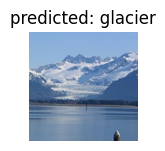

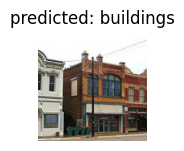

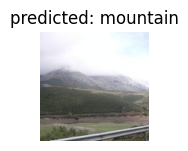

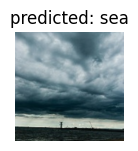

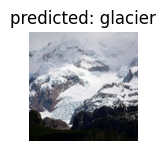

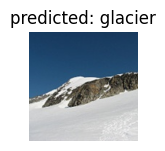

In [40]:
# Отже, тренування моделі тривало майже 7 хвилин, а досягнута точність становила 0.93
visualize_model(model_ft)

## Налаштування:
- В якості функцію втрат було використано CrossEntropyLoss.  
  Обґрунтування: CrossEntropyLoss є логічним вибором для задачі класифікації, оскільки ця функція втрат добре підходить для мультикласових задач, де кожен клас має ймовірність бути правильним результатом. Крос-ентропія має здатність штрафувати більші помилки сильніше, що може допомогти моделі краще пристосовуватися до даних, особливо коли йдеться про великі набори зображень чи складні класи..

- Оптимізатором вибрано SGD, який краще себе показав в минулій роботі. Проте варто спроьувати й інші оптимізатори 

- В якості метрики точності використані:
  - Accuracy,
  - F1 Score
  
  Обґрунтування: Для порівняння результату з вимогами завдання.

## Simple CNN (Варіант 1)
- Під час навчання моделі ми спостерігали позитивну динаміку зменшення функції втрат. Значення Loss за 200 епох зменшилось то 0.85 на тестових даних. Це свідчить про те, що модель поступово навчилася краще узгоджувати свої прогнози з реальними значеннями вхідних даних.
- F1 Score зросло до 0.79.
- Проте спостерігаємо суттєві рзбіжності на грфіку Accuracy. Тренувальна 0.61, Тестова 0.21. Що може свідчити про перетренування, або ж про розбалансованість тестових даних.
  
## Transfer Learning (Варіант 2)
- Точність на валідаційних даних склала 0.9327, а F1-метрика — 0.9323, що є дуже високим результатом і свідчить про покращену здатність моделі до узагальнення завдяки використанню transfer learning.

## Висновки:
- Досягти більш-менш прийнятного F1 Score 0.79 у першому варіанті (при навчанні з нуля) вдалося за рахунок збільшення кількості епох до 200, збільшення розміру батчу до 128, та збільшення кількості шарів моделі.
- Другий варіант (донавчання) показав себе значно краще - Acc: 0.93 F1: 0.93, що взагалі вважається досить високим результатом.
- Зрачна різниця також на користь донавчання в часових витратх (7 хвилин проти півгодини).

## Підсумки:
- Transfer learning значно перевищує просту CNN для цієї задачі завдяки своєму здатності адаптувати попередньо навчені ознаки до нової задачі.
- Для покращення моделі з простим CNN варто розглянути методи регуляризації, розширення даних і зменшення складності моделі для уникнення перенавчання, спробувати інші оптимізатори.